# Voice Biometric System using MLEND H&W Dataset and Machine Learning

# 1 Author

**Student Name**:  Shivansh Kaushik
**Student ID**:  210763340



# 2 Problem formulation

This project aims at building a machine learning solution for speaker voice recongition by using the MLEnd H&W dataset. The aim of the project is to train a machine learning pipeline which can take a hum or whistle recording as an input and can give the identity of the person as an output, given the person's hum/whistle recording was used to train the dataset.

# 3 Machine Learning pipeline

The machine learning pipeline for identification of voice of speaker from an audio segment will take a numpy list containg the exact path of the audio segments as an input and will return a numpy array containing the anonymous speaker ids of the recognized speakers as the output.

The input(list of paths of audio files) will undergo transformation wherein the features from the audio segments will be extracted, feature vector shape will be changed so that the model can use these vectors and then these features will be scaled. Then these scaled features will be passed onto the model which will predict the labels for the audio segments.

Following will be the flow inside the pipeline:-    

Input -> Feature Extractor -> Feature Vector Transformation -> Scaler -> Model -> Output(Prediciton)

# 4 Transformation stage

The numpy list containing the paths of the files is not the input to the model but will go through several transformations before reaching the model.
The input i.e. list will first be passed to a 'Feature Extractor' which will load these audio files using their paths from the list. The feature extractor will find the Mel Frequency Cepstral Co-efficients(MFCC) for the audio file using the MFCC function from python_speech_features library. In sound processing, the mel-frequency cepstrum is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.

Along with MFCC, MFCC delta (change in MFCC over time) was also extracted and used as a feature. 

The MFCC function will return a 2 dimensional array as a feature for a particular audio file and hence a 3-dimensional array for a list of files.

As the standard supervised classifiers like kNN, SVM, Random Forests cannot work on 3-dimensional arrays, the 3-dimenisional feature vector needed to be converted into a 2-dimensional vector. To do this, the mean along each column of a feature vector for a particular audio file was taken and used as a feature, hence making the feature vector for a audio file 1-dimensional and the feature vector for a list of files 2-dimensional. The 'Standard Scaler' will then receive the 2 dimensional array of features and it will scale it based on the mean and standard deviation of each feature. Now the 2-dimensional array consisting of scaled features will be passed onto the SVM model for prediction. Thus the transformation stage includes feature extraction, feature modeling(shape reduction) and feature scaling.

# 5 Modelling

Upon training and testing several models, an SVM model turned out to give the best performance metrics. 

A Support Vector Machine was expected to be suitable for solving this problem because SVM's generally perform better than other classifiers in a high dimensional space. It uses a subset of training points in the decision function called support vectors.

# 6 Methodology

The dataset used was the hum and whistles recording of 10 students with student ids from S1 to S10. Prior to uploading the dataset to the drive, the dataset was split into training and test set with the test set containing 3 recordings of each student. The training set was used to train different models and the test set was used to validate the models.

The performance metrics used for assessing the performance of a model were training-accuracy, validation-accuracy, precision, recall and f-score.

# 7 Dataset

The MLEnd Hums and Whistles dataset contains the hum and whistle '.wav' recordings of 8 songs submitted by 222 students but for this project, data of  only students S1-S10 was used to build the voice biometric classifier. A total of 150 files were obtained for S1-S10 but 3 files of each student were used for testing the model and rest for training. A total of 120 files were used for training the pipeline and 30 files for testing it.

The audio files were loaded and then their features were extracted.

Following is the code for importing and preprocessing the dataset.

In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importing Training Data

In [ ]:
sample_path = '/content/drive/MyDrive/Data/MLEndHW/S1-10/*.wav'
files_train = glob.glob(sample_path)
len(files_train)

120

Listening to some samples from the dataset

In [ ]:
for _ in range(5):
  n = np.random.randint(120)
  display(ipd.Audio(files_train[n]))

Plot of raw audio signal of one of the recording.

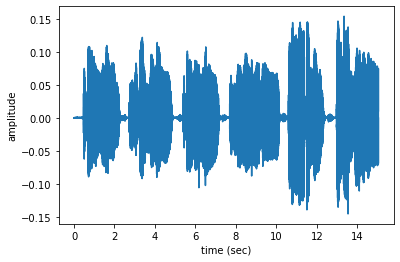

In [ ]:
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files_train[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files_train[n]))

Installing python_speech_features package

In [ ]:
!pip install python_speech_features

Following is the function to calculate MFCC Delta.

In [ ]:
def calculate_delta(array):
    rows,cols = array.shape
    print(rows)
    deltas = np.zeros((rows,20))
    N = 2
    for i in range(rows):
        index = []
        j = 1
        while j <= N:
            if i-j < 0:
                first = 0
            else:
                first = i-j
            if i+j > rows -1:
                second = rows -1
            else:
                second = i+j
            index.append((second,first))
            j+=1
        deltas[i] = ( array[index[0][0]]-array[index[0][1]] + (2 * (array[index[1][0]]-array[index[1][1]])) ) / 10
    return deltas


The following is the function for feature extraction which will extract the MFCC features and MFCC delta for training.

In [ ]:
import python_speech_features as mfcc
from sklearn import preprocessing
def extract_features(files):  
  rate = None # Sampling frequency. If None, fs would be 22050
  features=[]
  y=[]
  for file in tqdm(files):
    audio, rate = librosa.load(file,sr=rate)  
    mfcc_feat = mfcc.mfcc(audio,rate, 0.025, 0.01,20,appendEnergy = True, nfft=1103)
    mfcc_feat = preprocessing.scale(mfcc_feat)
    delta = calculate_delta(mfcc_feat)
    #combining both mfcc features and delta
    combined = np.hstack((mfcc_feat,delta))
    features.append(combined)
    y.append(file.split('/')[-1].split('_')[0]) 
  return features, y

Following is the function to extract features from audio files to be used for prediction.

In [ ]:
def extract_features_for_prediction(files):  
  rate = None # Sampling frequency. If None, fs would be 22050
  features=[]
  for file in tqdm(files):
    audio, rate = librosa.load(file,sr=rate)  
    mfcc_feat = mfcc.mfcc(audio,rate, 0.025, 0.01,20,appendEnergy = True, nfft=1103)
    mfcc_feat = preprocessing.scale(mfcc_feat)
    delta = calculate_delta(mfcc_feat)
    #combining both mfcc features and delta
    combined = np.hstack((mfcc_feat,delta))
    features.append(combined) 
  return features

The following code will call the feature extraction function to extract the features from the training audio files.

In [ ]:
features=[]
y=[]
features, y_train=extract_features(files_train)

  1%|          | 1/120 [00:00<00:23,  5.14it/s]

1489


  2%|▏         | 2/120 [00:00<00:26,  4.42it/s]

1774


  2%|▎         | 3/120 [00:00<00:25,  4.51it/s]

1513


  3%|▎         | 4/120 [00:00<00:25,  4.50it/s]

1487


  4%|▍         | 5/120 [00:01<00:28,  4.01it/s]

1638


  5%|▌         | 6/120 [00:01<00:28,  3.93it/s]

1638


  6%|▌         | 7/120 [00:01<00:27,  4.08it/s]

1503


  7%|▋         | 8/120 [00:01<00:27,  4.06it/s]

1658


  8%|▊         | 9/120 [00:02<00:27,  4.02it/s]

1572


  8%|▊         | 10/120 [00:02<00:27,  3.97it/s]

1629


  9%|▉         | 11/120 [00:02<00:26,  4.13it/s]

1502


 10%|█         | 12/120 [00:02<00:26,  4.06it/s]

1693


 11%|█         | 13/120 [00:03<00:27,  3.84it/s]

1817


 12%|█▏        | 14/120 [00:03<00:27,  3.80it/s]

1809


 12%|█▎        | 15/120 [00:03<00:26,  3.92it/s]

1655


 13%|█▎        | 16/120 [00:03<00:25,  4.03it/s]

1576


 14%|█▍        | 17/120 [00:04<00:25,  4.02it/s]

1674


 15%|█▌        | 18/120 [00:04<00:25,  4.06it/s]

1519


 16%|█▌        | 19/120 [00:04<00:24,  4.06it/s]

1722


 17%|█▋        | 20/120 [00:04<00:24,  4.07it/s]

1613


 18%|█▊        | 21/120 [00:05<00:24,  4.00it/s]

1604


 18%|█▊        | 22/120 [00:05<00:24,  4.04it/s]

1690


 19%|█▉        | 23/120 [00:05<00:23,  4.04it/s]

1748


 20%|██        | 24/120 [00:05<00:23,  4.08it/s]

1529


 21%|██        | 25/120 [00:06<00:23,  4.08it/s]

1609


 22%|██▏       | 26/120 [00:06<00:22,  4.18it/s]

1538


 22%|██▎       | 27/120 [00:06<00:22,  4.11it/s]

1774


 23%|██▎       | 28/120 [00:06<00:22,  4.17it/s]

1585


 24%|██▍       | 29/120 [00:07<00:22,  4.11it/s]

1703


 25%|██▌       | 30/120 [00:07<00:22,  4.06it/s]

1688


 26%|██▌       | 31/120 [00:07<00:23,  3.87it/s]

1931


 27%|██▋       | 32/120 [00:07<00:23,  3.79it/s]

1815


 28%|██▊       | 33/120 [00:08<00:21,  4.00it/s]

1508


 28%|██▊       | 34/120 [00:08<00:21,  4.07it/s]

1602


 29%|██▉       | 35/120 [00:08<00:21,  4.05it/s]

1674


 30%|███       | 36/120 [00:08<00:20,  4.17it/s]

1599


 31%|███       | 37/120 [00:09<00:20,  3.97it/s]

1886


 32%|███▏      | 38/120 [00:09<00:21,  3.88it/s]

1659


 32%|███▎      | 39/120 [00:09<00:21,  3.80it/s]

1912


 33%|███▎      | 40/120 [00:09<00:20,  3.93it/s]

1635


 34%|███▍      | 41/120 [00:10<00:19,  3.96it/s]

1626


 35%|███▌      | 42/120 [00:10<00:19,  3.99it/s]

1541


 36%|███▌      | 43/120 [00:10<00:19,  4.04it/s]

1619


 37%|███▋      | 44/120 [00:10<00:18,  4.10it/s]

1554


 38%|███▊      | 45/120 [00:11<00:18,  4.09it/s]

1645


 38%|███▊      | 46/120 [00:11<00:19,  3.84it/s]

1838


 39%|███▉      | 47/120 [00:11<00:17,  4.11it/s]

1398


 40%|████      | 48/120 [00:11<00:16,  4.31it/s]

1444
1457


 42%|████▏     | 50/120 [00:12<00:16,  4.29it/s]

1594


 42%|████▎     | 51/120 [00:12<00:16,  4.17it/s]

1790


 43%|████▎     | 52/120 [00:12<00:16,  4.24it/s]

1608


 44%|████▍     | 53/120 [00:13<00:16,  4.16it/s]

1639


 45%|████▌     | 54/120 [00:13<00:15,  4.22it/s]

1508


 46%|████▌     | 55/120 [00:13<00:15,  4.27it/s]

1494


 47%|████▋     | 56/120 [00:13<00:15,  4.18it/s]

1693


 48%|████▊     | 57/120 [00:13<00:14,  4.34it/s]

1398


 48%|████▊     | 58/120 [00:14<00:14,  4.28it/s]

1624


 49%|████▉     | 59/120 [00:14<00:14,  4.24it/s]

1545


 50%|█████     | 60/120 [00:14<00:13,  4.33it/s]

1519


 51%|█████     | 61/120 [00:14<00:13,  4.26it/s]

1633


 52%|█████▏    | 62/120 [00:15<00:13,  4.29it/s]

1651


 52%|█████▎    | 63/120 [00:15<00:13,  4.29it/s]

1625


 53%|█████▎    | 64/120 [00:15<00:12,  4.31it/s]

1513


 54%|█████▍    | 65/120 [00:15<00:12,  4.41it/s]

1462


 55%|█████▌    | 66/120 [00:16<00:12,  4.41it/s]

1506


 56%|█████▌    | 67/120 [00:16<00:12,  4.32it/s]

1619


 57%|█████▋    | 68/120 [00:16<00:12,  4.20it/s]

1626


 57%|█████▊    | 69/120 [00:16<00:12,  4.22it/s]

1677


 58%|█████▊    | 70/120 [00:16<00:11,  4.32it/s]

1524


 59%|█████▉    | 71/120 [00:17<00:11,  4.21it/s]

1688


 60%|██████    | 72/120 [00:17<00:11,  4.13it/s]

1648


 61%|██████    | 73/120 [00:17<00:11,  4.23it/s]

1632


 62%|██████▏   | 74/120 [00:17<00:11,  4.17it/s]

1629


 62%|██████▎   | 75/120 [00:18<00:10,  4.31it/s]

1442


 63%|██████▎   | 76/120 [00:18<00:10,  4.31it/s]

1638


 64%|██████▍   | 77/120 [00:18<00:10,  4.10it/s]

1817


 65%|██████▌   | 78/120 [00:18<00:10,  4.14it/s]

1586


 66%|██████▌   | 79/120 [00:19<00:09,  4.12it/s]

1635


 67%|██████▋   | 80/120 [00:19<00:10,  3.89it/s]

1951


 68%|██████▊   | 81/120 [00:19<00:09,  3.93it/s]

1651


 68%|██████▊   | 82/120 [00:19<00:09,  4.00it/s]

1682


 69%|██████▉   | 83/120 [00:20<00:09,  4.09it/s]

1632


 70%|███████   | 84/120 [00:20<00:08,  4.07it/s]

1487


 71%|███████   | 85/120 [00:20<00:08,  4.04it/s]

1682


 72%|███████▏  | 86/120 [00:20<00:08,  3.93it/s]

1817


 72%|███████▎  | 87/120 [00:21<00:08,  3.71it/s]

1912


 73%|███████▎  | 88/120 [00:21<00:08,  3.78it/s]

1664


 74%|███████▍  | 89/120 [00:21<00:08,  3.69it/s]

2007


 75%|███████▌  | 90/120 [00:22<00:09,  3.25it/s]

2691


 76%|███████▌  | 91/120 [00:22<00:08,  3.52it/s]

1635


 77%|███████▋  | 92/120 [00:22<00:07,  3.77it/s]

1504


 78%|███████▊  | 93/120 [00:22<00:06,  3.95it/s]

1487


 78%|███████▊  | 94/120 [00:23<00:06,  3.90it/s]

1832


 79%|███████▉  | 95/120 [00:23<00:06,  3.99it/s]

1524


 80%|████████  | 96/120 [00:23<00:05,  4.04it/s]

1564


 81%|████████  | 97/120 [00:23<00:05,  3.84it/s]

1955


 82%|████████▏ | 98/120 [00:24<00:05,  4.01it/s]

1436


 82%|████████▎ | 99/120 [00:24<00:05,  4.06it/s]

1628


 83%|████████▎ | 100/120 [00:24<00:04,  4.03it/s]

1776


 84%|████████▍ | 101/120 [00:24<00:04,  4.11it/s]

1632


 85%|████████▌ | 102/120 [00:25<00:04,  4.08it/s]

1604


 86%|████████▌ | 103/120 [00:25<00:04,  4.12it/s]

1677


 87%|████████▋ | 104/120 [00:25<00:03,  4.13it/s]

1581


 88%|████████▊ | 105/120 [00:25<00:03,  4.08it/s]

1546
1282


 89%|████████▉ | 107/120 [00:26<00:02,  4.42it/s]

1500


 90%|█████████ | 108/120 [00:26<00:02,  4.14it/s]

1858


 91%|█████████ | 109/120 [00:26<00:02,  4.12it/s]

1540


 92%|█████████▏| 110/120 [00:27<00:02,  4.04it/s]

1622


 92%|█████████▎| 111/120 [00:27<00:02,  4.02it/s]

1783


 93%|█████████▎| 112/120 [00:27<00:01,  4.17it/s]

1510


 94%|█████████▍| 113/120 [00:27<00:01,  4.18it/s]

1627


 95%|█████████▌| 114/120 [00:27<00:01,  4.31it/s]

1500


 96%|█████████▌| 115/120 [00:28<00:01,  4.06it/s]

1665


 97%|█████████▋| 116/120 [00:28<00:01,  3.98it/s]

1764


 98%|█████████▊| 117/120 [00:28<00:00,  4.02it/s]

1736


 98%|█████████▊| 118/120 [00:28<00:00,  4.10it/s]

1563


 99%|█████████▉| 119/120 [00:29<00:00,  4.08it/s]

1593


100%|██████████| 120/120 [00:29<00:00,  4.08it/s]

1508


The following line of  code shows the shape of the features of a single audio file. It can be seen that the features for a single audio file is a 2-dimensional array.

In [ ]:
features[0]

array([[-2.22686951, -2.56813806, -1.28434581, ..., -0.13865206,
         0.02992329, -0.11393362],
       [-2.08893297, -2.47431377, -1.03853356, ..., -0.06654906,
         0.05686827, -0.14300445],
       [-1.97632994, -2.32147759, -0.96646883, ...,  0.09167964,
         0.14587339, -0.05360396],
       ...,
       [-1.90571801, -1.38593532,  1.70757551, ...,  0.12855852,
         0.24862956,  0.03277848],
       [-2.06837431, -1.55047117,  1.25860439, ...,  0.02313449,
         0.15478799, -0.02706473],
       [-2.35468589, -1.89604736,  0.86640018, ..., -0.03087346,
        -0.05030508, -0.15313847]])

As the feature vector returned by the above code is a 3-dimensional array, the mean of the features of each audio sample is supposed to be taken to make the feature vector 2-dimensional. The following is the definition of the function for replacing the 2-dimensional feature for a particular audio file with their mean.

In [ ]:
def mean_of_features(features):
 X=[]
 for rec in features:
  rec_np=np.array(rec)
  X.append(rec_np.mean(0))
 return X

The following is the definition of function for scaling of features

In [ ]:
from sklearn.preprocessing import StandardScaler
def feature_scaler(X):
  scaler=StandardScaler()
  scaler.fit(X)
  X=scaler.transform(X)
  return X

The following code will reduce the shape of the feature vector by calling the mean_of_features function and scale the features using the feature_scaler function.

In [ ]:
X_train=mean_of_features(features)
X_train=np.array(X_train)
y_train=np.array(y_train)
X_train=feature_scaler(X_train)

In [ ]:
X_train.shape

(120, 40)

In [ ]:
y_train.shape

(120,)

The following code will import the test data, extract features, take mean of features and then scale the feature vector.

In [ ]:
sample_path = '/content/drive/MyDrive/Data/MLEndHW/testdata/*.wav'
test_files = glob.glob(sample_path)
len(test_files)

30

In [ ]:
features_test, y_test=extract_features(test_files)

  3%|▎         | 1/30 [00:00<00:05,  5.12it/s]

1489


  7%|▋         | 2/30 [00:00<00:06,  4.29it/s]

1629


 10%|█         | 3/30 [00:00<00:06,  4.16it/s]

1674


 13%|█▎        | 4/30 [00:00<00:06,  4.27it/s]

1576


 17%|█▋        | 5/30 [00:01<00:06,  4.13it/s]

1658


 20%|██        | 6/30 [00:01<00:06,  3.96it/s]

1693


 23%|██▎       | 7/30 [00:01<00:05,  4.00it/s]

1748


 27%|██▋       | 8/30 [00:01<00:05,  3.98it/s]

1703


 30%|███       | 9/30 [00:02<00:05,  4.11it/s]

1541


 33%|███▎      | 10/30 [00:02<00:04,  4.02it/s]

1639


 37%|███▋      | 11/30 [00:02<00:04,  4.02it/s]

1594


 40%|████      | 12/30 [00:02<00:04,  4.18it/s]

1457


 43%|████▎     | 13/30 [00:03<00:04,  4.11it/s]

1633


 47%|████▋     | 14/30 [00:03<00:03,  4.02it/s]

1682


 50%|█████     | 15/30 [00:03<00:03,  4.07it/s]

1638


 53%|█████▎    | 16/30 [00:03<00:03,  4.06it/s]

1626


 57%|█████▋    | 17/30 [00:04<00:03,  4.18it/s]

1442


 60%|██████    | 18/30 [00:04<00:02,  4.07it/s]

1635


 63%|██████▎   | 19/30 [00:04<00:02,  4.17it/s]

1506


 67%|██████▋   | 20/30 [00:04<00:02,  4.15it/s]

1776


 70%|███████   | 21/30 [00:05<00:02,  3.97it/s]

1832


 73%|███████▎  | 22/30 [00:05<00:02,  3.74it/s]

1912


 77%|███████▋  | 23/30 [00:05<00:01,  3.94it/s]

1504


 80%|████████  | 24/30 [00:05<00:01,  3.92it/s]

1664


 83%|████████▎ | 25/30 [00:06<00:01,  3.97it/s]

1677


 87%|████████▋ | 26/30 [00:06<00:00,  4.03it/s]

1627


 90%|█████████ | 27/30 [00:06<00:00,  4.03it/s]

1581


 93%|█████████▎| 28/30 [00:06<00:00,  4.12it/s]

1508


 97%|█████████▋| 29/30 [00:07<00:00,  4.09it/s]

1593


100%|██████████| 30/30 [00:07<00:00,  4.08it/s]

1500


In [ ]:
X_test=mean_of_features(features_test)
X_test=np.array(X_test)
y_test=np.array(y_test)
X_test=feature_scaler(X_test)

In [ ]:
X_test.shape

(30, 40)

In [ ]:
y_test.shape

(30,)

# 8 Results


The following code will test the SVM model.

In [ ]:
from sklearn import svm
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report
svm_model  = svm.SVC(C=1)
svm_model.fit(X_train,y_train)

yt_p = svm_model.predict(X_train)
yv_p = svm_model.predict(X_test)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Test  Accuracy', np.mean(yv_p==y_test))
print('The support vectors are', model.support_vectors_.shape)
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.975
Test  Accuracy 1.0
The support vectors are (120, 40)
              precision    recall  f1-score   support

          S1       1.00      1.00      1.00         3
         S10       1.00      1.00      1.00         3
          S2       1.00      1.00      1.00         3
          S3       1.00      1.00      1.00         2
          S4       1.00      1.00      1.00         4
          S5       1.00      1.00      1.00         3
          S6       1.00      1.00      1.00         3
          S7       1.00      1.00      1.00         3
          S8       1.00      1.00      1.00         3
          S9       1.00      1.00      1.00         3

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

(1.0, 1.0, 1.0, None)


As we can see from the performance report shown above, the SVM model seems to have performed well on the dataset. The training accuracy obtained is 97.5% and validation accuracy 100% which made it interesting. 

Next, several kNN models were trained with 2, 3, 5, 7 neighbours.

In [ ]:
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train, y_train)

yt_p = knn.predict(X_train)
yv_p = knn.predict(X_test)
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.6916666666666667
Validation  Accuracy 0.6666666666666666
              precision    recall  f1-score   support

          S1       1.00      1.00      1.00         3
         S10       0.60      1.00      0.75         3
          S2       0.33      0.67      0.44         3
          S3       1.00      1.00      1.00         2
          S4       0.80      1.00      0.89         4
          S5       0.50      0.33      0.40         3
          S6       0.33      0.33      0.33         3
          S7       0.00      0.00      0.00         3
          S8       1.00      0.67      0.80         3
          S9       1.00      0.67      0.80         3

    accuracy                           0.67        30
   macro avg       0.66      0.67      0.64        30
weighted avg       0.65      0.67      0.64        30

(0.6566666666666666, 0.6666666666666667, 0.6416666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

yt_p = knn.predict(X_train)
yv_p = knn.predict(X_test)
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.6416666666666667
Validation  Accuracy 0.6
              precision    recall  f1-score   support

          S1       0.67      0.67      0.67         3
         S10       0.17      0.33      0.22         3
          S2       0.20      0.33      0.25         3
          S3       1.00      1.00      1.00         2
          S4       0.67      1.00      0.80         4
          S5       1.00      0.33      0.50         3
          S6       1.00      1.00      1.00         3
          S7       0.00      0.00      0.00         3
          S8       1.00      0.67      0.80         3
          S9       1.00      0.67      0.80         3

    accuracy                           0.60        30
   macro avg       0.67      0.60      0.60        30
weighted avg       0.66      0.60      0.60        30

(0.6699999999999999, 0.6, 0.6038888888888888, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

yt_p = knn.predict(X_train)
yv_p = knn.predict(X_test)
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.6083333333333333
Validation  Accuracy 0.5
              precision    recall  f1-score   support

          S1       0.00      0.00      0.00         3
         S10       0.50      0.33      0.40         3
          S2       0.18      0.67      0.29         3
          S3       1.00      0.50      0.67         2
          S4       0.80      1.00      0.89         4
          S5       1.00      0.33      0.50         3
          S6       0.67      0.67      0.67         3
          S7       1.00      0.33      0.50         3
          S8       0.33      0.33      0.33         3
          S9       1.00      0.67      0.80         3

    accuracy                           0.50        30
   macro avg       0.65      0.48      0.50        30
weighted avg       0.64      0.50      0.51        30

(0.6481818181818182, 0.4833333333333333, 0.5041269841269841, None)


In [ ]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

yt_p = knn.predict(X_train)
yv_p = knn.predict(X_test)
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.4583333333333333
Validation  Accuracy 0.4
              precision    recall  f1-score   support

          S1       0.00      0.00      0.00         3
         S10       0.50      0.33      0.40         3
          S2       0.25      0.67      0.36         3
          S3       0.33      0.50      0.40         2
          S4       0.57      1.00      0.73         4
          S5       0.00      0.00      0.00         3
          S6       0.50      0.33      0.40         3
          S7       1.00      0.33      0.50         3
          S8       0.50      0.33      0.40         3
          S9       1.00      0.33      0.50         3

    accuracy                           0.40        30
   macro avg       0.47      0.38      0.37        30
weighted avg       0.47      0.40      0.38        30

(0.46547619047619043, 0.3833333333333333, 0.3690909090909091, None)


As we can see from the report above the kNN models performed poorly on the dataset, hence SVM model was chosen to train the final model.

The following code will display the performance metrics of the final model(i.e. SVM) again.

In [ ]:
yt_p=svm_model.predict(X_train)
yv_p=svm_model.predict(X_test)
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_test))
print(classification_report(y_test, yv_p))
print(precision_recall_fscore_support(y_test, yv_p, average='macro')) 

Training Accuracy 0.975
Validation  Accuracy 1.0
              precision    recall  f1-score   support

          S1       1.00      1.00      1.00         3
         S10       1.00      1.00      1.00         3
          S2       1.00      1.00      1.00         3
          S3       1.00      1.00      1.00         2
          S4       1.00      1.00      1.00         4
          S5       1.00      1.00      1.00         3
          S6       1.00      1.00      1.00         3
          S7       1.00      1.00      1.00         3
          S8       1.00      1.00      1.00         3
          S9       1.00      1.00      1.00         3

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

(1.0, 1.0, 1.0, None)


# 9 Conclusions
The aim of  this project to recognize the voice of a speaker from the MLEnd H&W dataset was achieved by training and testing several models. SVM seems to have outperformed all the models and gave the best performance metrics.

The reason for such a high accuracy maybe the fact that a smaller dataset was used to train the model and even smaller to test.

The solution to this problem could be better achieved if a larger dataset was used for both training and testing i.e. more recordings per student and we could've been more satisfied for a higher accuracy. Also, as MFCC returns a 3-dimensional feature vector for a list of samples, the shape of the vector was reduced, hence some important features for the dataset were lost. A neural network such as Convulation Neural Network should've been used as it can work upon 3-dimensional training data and gives better accuracy than classsifiers such as SVM, kNN etc.